<header style="text-align:center;">
  <h1 style="color:#FF8C00; font-family:Arial, sans-serif; margin-bottom:0;">
    Practical work on SAR statistics
  </h1>
  <h2 style="color:#E76F51; font-family:Arial, sans-serif; margin-top:5px;">
    TP IMA207
  </h2>
  <p style="font-weight:bold; color:#2A9D8F; font-family:Arial, sans-serif;">
    Name : Le Guillouzic Maël
  </p>
</header>

<hr style="border:1px solid #DDD; margin:20px 0;">

#### Emanuele DALSASSO, Florence TUPIN, Cristiano ULONDU MENDES, Thomas BULTINGAIRE

<h3 style="color: #A0C4FF; font-family: Arial, sans-serif; margin-top: 25px; margin-bottom: 10px;">
  Statistics and despeckling
</h3>

The practical work is divided in 3 parts

- A. empirical checking of the distributions seen in course for synthetic speckle
- B. computation of equivalent number of looks using images of physically homogeneous areas
- C. spatial multi-looking and implementation of the Lee filter

You have at your disposal several images of various areas acquired by different acquisition modes.
- An oceanfront in São-Paulo acquired by Sentinel-1 sensor (ESA) in GRD (Ground Range Detected) mode
- A farmland near from Bologne (Italy) acquired by TerraSAR-X sensor (ESA) in MGD (Multi Look Ground Range Detected) mode
- An area near from Rome acquired by TerraSAR-X sensor (ESA) in SLC (Single Look Complex) mode
- A temporal stack of images acquired at Flevoland in Netherlands by Alos sensor (JAXA) in SLC mode

Some useful functions are available in the file *mvalab.py*.

<h3 style="color: #A0C4FF; font-family: Arial, sans-serif; margin-top: 25px; margin-bottom: 10px;">
  Instructions
</h3>

To solve this practical session, answer the questions below. Then export the notebook with the answers using the menu option **File -> Download as -> Notebook (.ipynb)**. Then [submit the resulting file on e-campus by next week.

<h3 style="color: #A0C4FF; font-family: Arial, sans-serif; margin-bottom: 10px;">
  Import the libraries and packages we are going to use
</h3>
The following cell imports all that is going to be necessary for the practical work

In [1]:
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/mvalab.py

--2025-05-20 23:22:53--  https://perso.telecom-paristech.fr/tupin/TPSAR/mvalab.py
Résolution de perso.telecom-paristech.fr (perso.telecom-paristech.fr)… 2a04:8ec0:0:a::89c2:16e3, 137.194.22.227
Connexion à perso.telecom-paristech.fr (perso.telecom-paristech.fr)|2a04:8ec0:0:a::89c2:16e3|:443… connecté.
requête HTTP transmise, en attente de la réponse… 200 OK
Taille : 68071 (66K) [text/x-python]
Sauvegarde en : « mvalab.py.2 »

mvalab.py.2         100%[===================>]  66,48K  --.-KB/s    ds 0,007s  

2025-05-20 23:22:53 (8,76 MB/s) — « mvalab.py.2 » sauvegardé [68071/68071]



In [2]:
import scipy
from scipy import signal
import scipy.signal
import scipy as spy
import scipy.fftpack
from scipy import ndimage
from scipy import special
from scipy import ndimage
import numpy as np
import math
import matplotlib.pyplot as plt
import mvalab as mvalab
from urllib.request import urlopen
import cmath

plt.rcParams['figure.figsize'] = [15, 15]
plt.rcParams['figure.max_open_warning'] = 30

<h1 style="color:#FF8C00; font-family:Arial, sans-serif;">
  A. Single Look Data Distributions
</h1>

In this part, we will simulate an SLC (Single Look Complex) SAR image representing an homogeneous area and analyze the pdfs of its intensity and phase.

<h2 style="color:#006400; font-family:Arial, sans-serif;">
  Single look data simulation
</h2>

According to the Goodman model, the real and imaginary parts of each pixel of an SLC SAR image are independent and identically distributed according to a Gaussian distribution centered and of variance equal to the reflectivity of the pixel divided by 2.\
Choose randomly a reflectity value $R$ in the interval $[100, 200]$ and create a SLC SAR image of size $150\times 150$ representing an homogeneous area of reflectivity $R$.

Affichage d'une image reelle
plt.show dans visusar : image 150 x 150


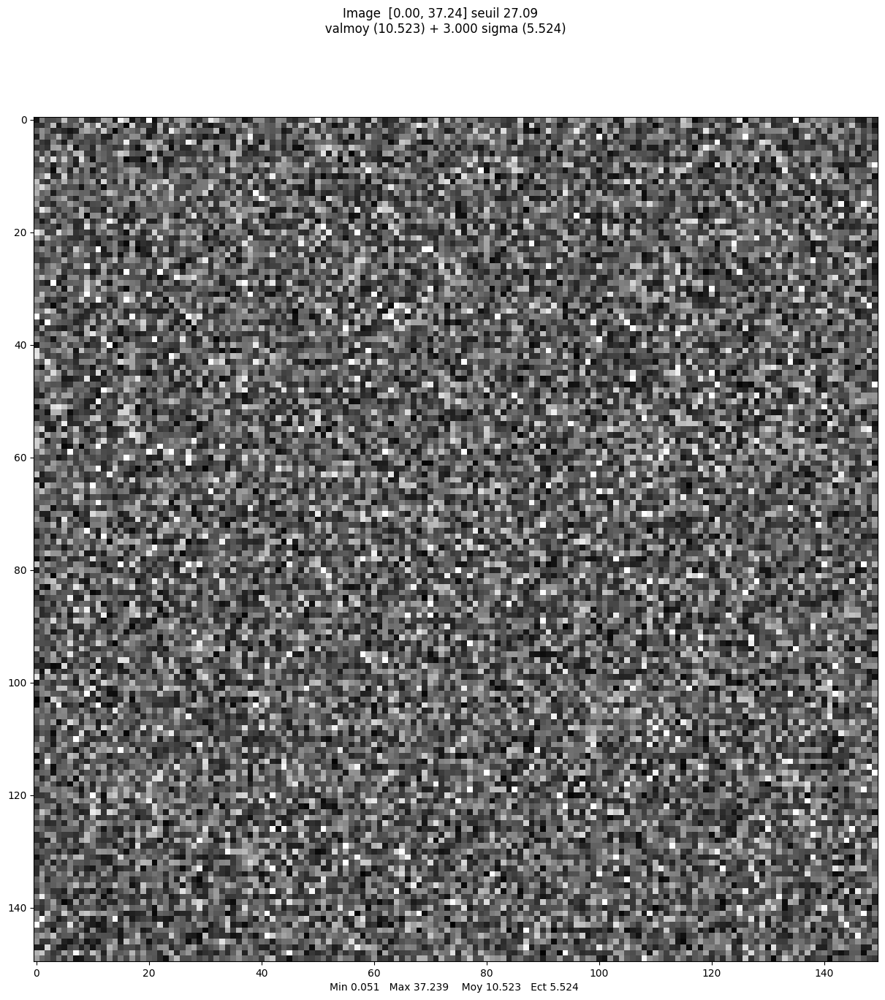

array([[ 2.41356858, 13.25734241,  8.03072408, ...,  2.71830508,
        12.70423314,  4.90618841],
       [ 5.19640794,  5.05922665,  9.21809185, ...,  3.98212205,
         9.5288558 ,  1.81167036],
       [ 9.93950694, 15.24071834, 11.86425811, ...,  8.03532255,
        10.16475461,  4.87697488],
       ...,
       [ 3.37657151,  3.23829974, 22.84821995, ...,  3.01867568,
         3.46600041, 16.85990973],
       [18.98719696, 21.04291502,  9.81395866, ...,  1.19783938,
        11.23347549, 10.92626981],
       [16.84736866, 10.98068381,  9.17164555, ...,  9.44095166,
         6.95294879,  5.83496912]])

In [3]:
# Chose the reflectivity of the homogeneous area
R = np.random.uniform(100,200)

# Simulate the corresponding SLC image
ima_slc = np.sqrt(R/2)*(np.random.randn(150,150) + 1j*np.random.randn(150,150))
mvalab.visusar(np.abs(ima_slc))

<h2 style="color:#006400; font-family:Arial, sans-serif;">
  Data distributions for an homogeneous area
</h2>

compute the distribution of the phase and intensity of your image.
Then, estimate the coefficient of variation:  
$\gamma=\frac{\sigma}{\mu}$ using intensity data (square of the modulus of the complex field)

In [4]:
# Compute the intensity and the phase
ima_int = np.abs(ima_slc)**2
ima_ph  = np.angle(ima_slc)

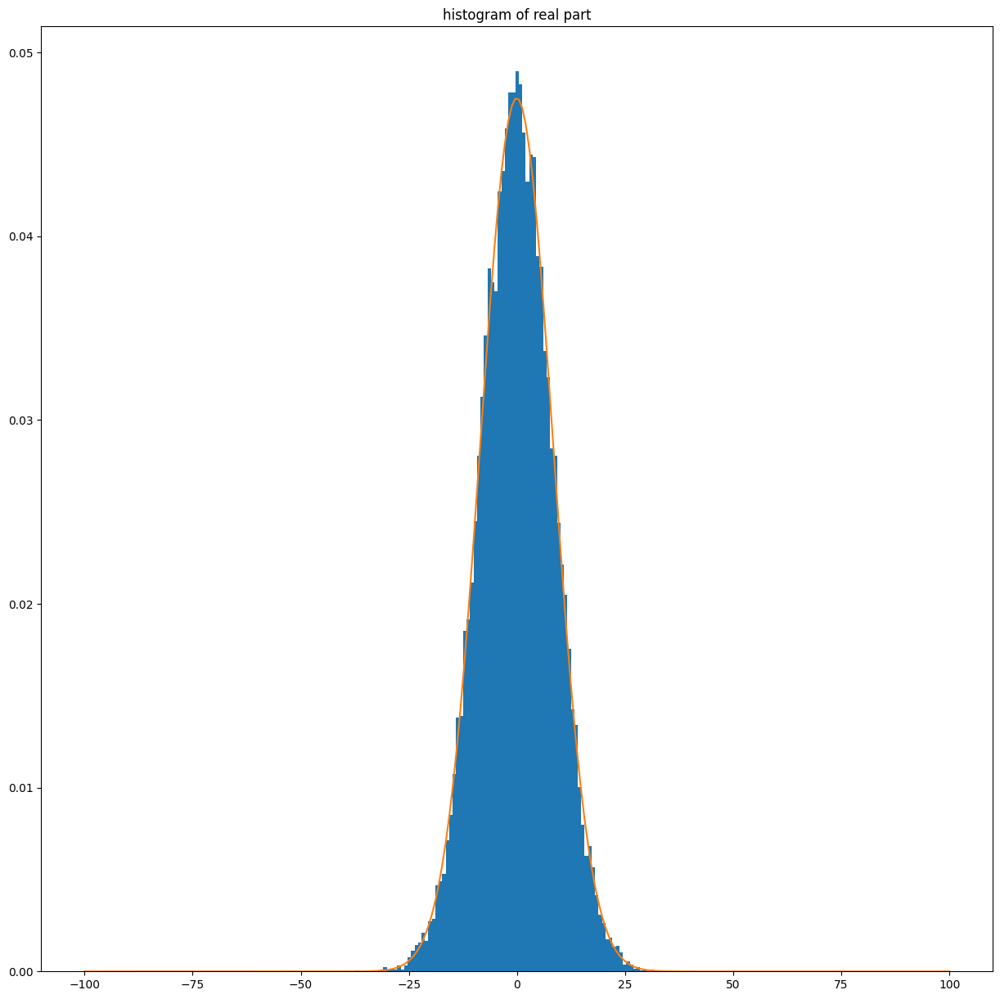

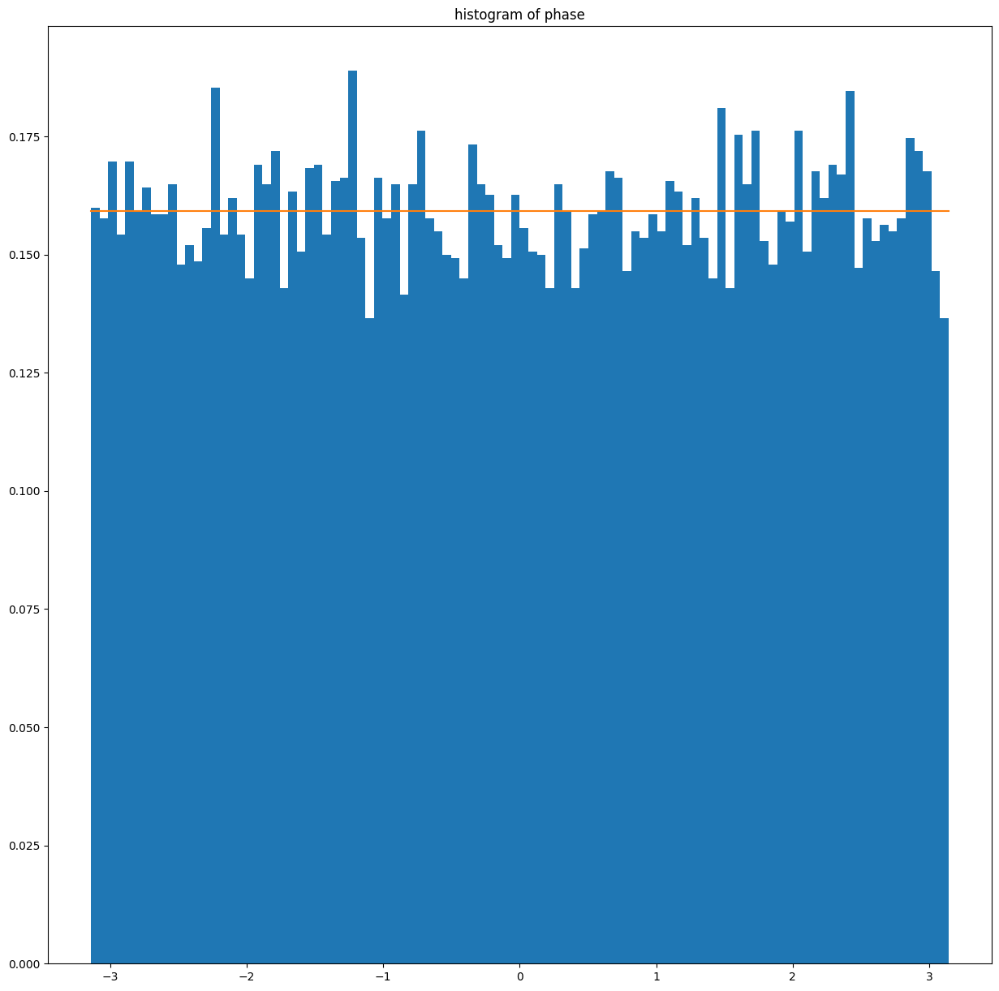

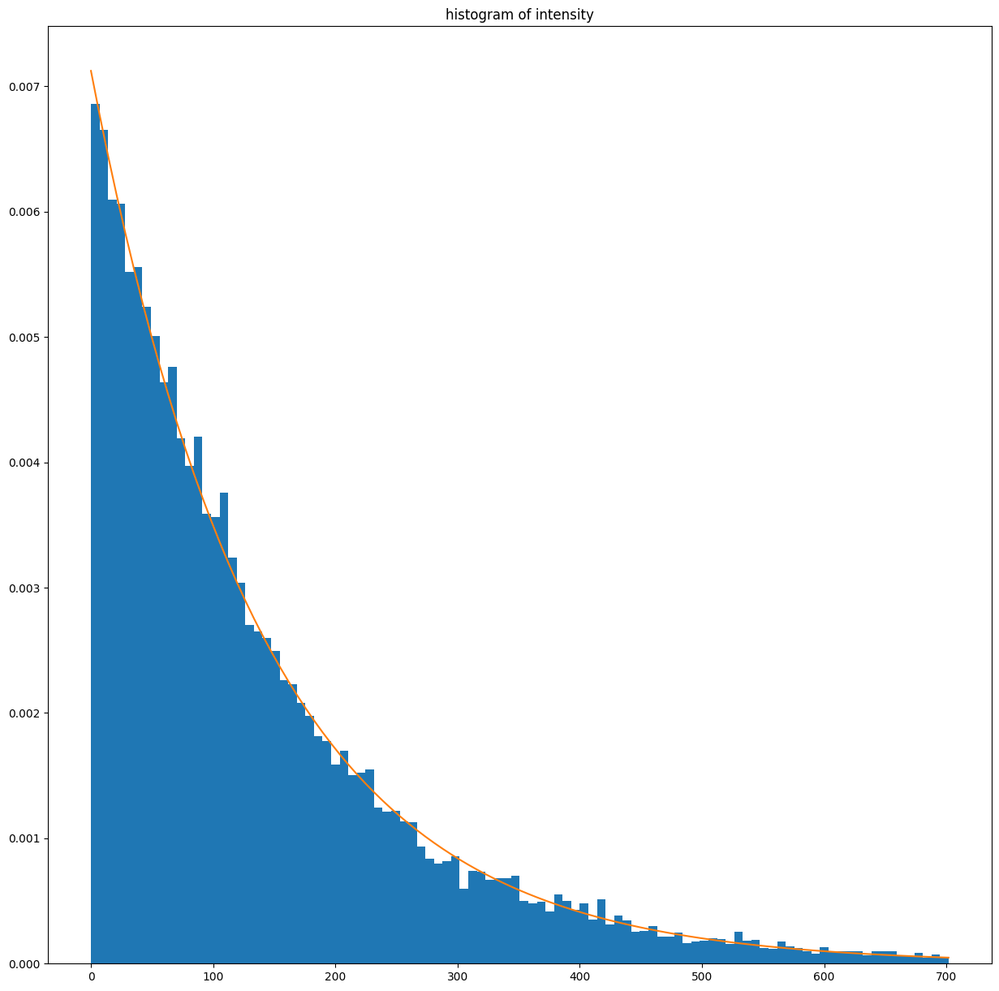

In [5]:
# Plot the histograms and verify they match the theoretical distribution
# Use the right range of values to plot the histogram
# Choose the right distribution to do the fitting

# fitting of the distributions
# use the following ones :
# Gaussian pdf : scipy.stats.uniform
# Rayleigh pdf : scipy.stats.rayleigh
# Exponential pdf : scipy.stats.expon

#example for real part of the data
plt.figure()
_, bins, _ = plt.hist(np.real(ima_slc).ravel(),bins='auto',density=True,range=[-100,100])  # Gaussian distribution
mu, sigma = scipy.stats.norm.fit(np.real(ima_slc))
best_fit_line = scipy.stats.norm.pdf(bins, mu, sigma)
plt.plot(bins, best_fit_line)
plt.title('histogram of real part')
plt.show()

import scipy.stats as stats

#complete for phase data: Uniform distribution
plt.figure()
counts, bins, _ = plt.hist(ima_ph.ravel(), bins=100, density=True, range=[-np.pi, np.pi])  # phase
loc, scale = -np.pi, 2*np.pi
best_fit_line = stats.uniform.pdf(bins, loc=loc, scale=scale)
plt.plot(bins, best_fit_line)
plt.title('histogram of phase')
plt.show()


#complete for intensity data: Exponential (Gamma) distribution
plt.figure()
counts, bins, _ = plt.hist(ima_int.ravel(), bins=100, density=True, range=[0, 5*R])  # intensité
best_fit_line = stats.expon.pdf(bins, scale=R)
plt.plot(bins, best_fit_line)
plt.title('histogram of intensity')
plt.show()

In [9]:
# Compute the coefficient of variation on the homogeneous area in intensity

m_I = np.mean(ima_int)
sigma_I = np.std(ima_int)
coeff_var_I = sigma_I / m_I
print(f"Coefficient de variation de l'intensité : {coeff_var_I:.4f}")

Coefficient de variation de l'intensité : 1.0124


<h4 style="color:#2A9D8F; font-family:Arial, sans-serif; margin-bottom:10px;">
  <strong>Question A.1.</strong>
</h4>
Did you find the distributions seen in the course ? (recapitulate them).
Did you find the correct value for the coefficient of variation ? Could this coefficient be less than the theoretical value ?

<h4 style="color:#2A9D8F; font-family:Arial, sans-serif; margin-bottom:10px;">
  <strong>Answer A.1.</strong>
</h4>
On observe bien que : 
- la partie réelle (et imaginaire aussi mais pas plot ici) suit une loi $\mathcal{N}(0,R/2)$, 
- la phase est uniforme sur $[-π,π]$
- l’amplitude suit une loi de Rayleigh et l’intensité une exponentielle de paramètre $R$.

De plus lorsqu'on calcule le coeff de variation, il est proche de 1 comme attendu.

<h1 style="color:#FF8C00; font-family:Arial, sans-serif;">
  B. Computation of the ENL on homogeneous areas
</h1>

In this part you have at your disposal 2 images of a part a ocean (São-Paulo) and a part of a field (Bologne, Italy). The first is acquired by Sentinel-1 GRD, and the second by TerraSAR-X GRD. The multi-looking has been done by the data provider (ESA, European Space Agency).

Use the value of the coefficient of variation to find the Equivalent Number of Looks (ENL) of the Sentinel-1 GRD and TerraSAR-X GRD data.
The formula is :
- $\gamma_I=\frac{1}{\sqrt{L}}$ for intensity data

In [10]:
# Download the images
!wget "https://partage.imt.fr/index.php/s/7RfHSqLgTfn2Mx6/download/amplitude_Sao-Paulo_S1_SM_GRD.npy"
!wget "https://partage.imt.fr/index.php/s/fosXSfBSPzygzRX/download/amplitude_Bologne_TSX_SM_MGD.npy"

--2025-05-21 16:17:06--  https://partage.imt.fr/index.php/s/7RfHSqLgTfn2Mx6/download/amplitude_Sao-Paulo_S1_SM_GRD.npy
Résolution de partage.imt.fr (partage.imt.fr)… 193.48.235.12
Connexion à partage.imt.fr (partage.imt.fr)|193.48.235.12|:443… connecté.
requête HTTP transmise, en attente de la réponse… 200 OK
Taille : 4194432 (4,0M) [application/octet-stream]
Sauvegarde en : « amplitude_Sao-Paulo_S1_SM_GRD.npy »

amplitude_Sao-Paulo 100%[===================>]   4,00M  5,91MB/s    ds 0,7s    

2025-05-21 16:17:07 (5,91 MB/s) — « amplitude_Sao-Paulo_S1_SM_GRD.npy » sauvegardé [4194432/4194432]

--2025-05-21 16:17:07--  https://partage.imt.fr/index.php/s/fosXSfBSPzygzRX/download/amplitude_Bologne_TSX_SM_MGD.npy
Résolution de partage.imt.fr (partage.imt.fr)… 193.48.235.12
Connexion à partage.imt.fr (partage.imt.fr)|193.48.235.12|:443… connecté.
requête HTTP transmise, en attente de la réponse… 200 OK
Taille : 4194432 (4,0M) [application/octet-stream]
Sauvegarde en : « amplitude_Bologne_TSX

Affichage d'une image reelle
plt.show dans visusar : image 194 x 161


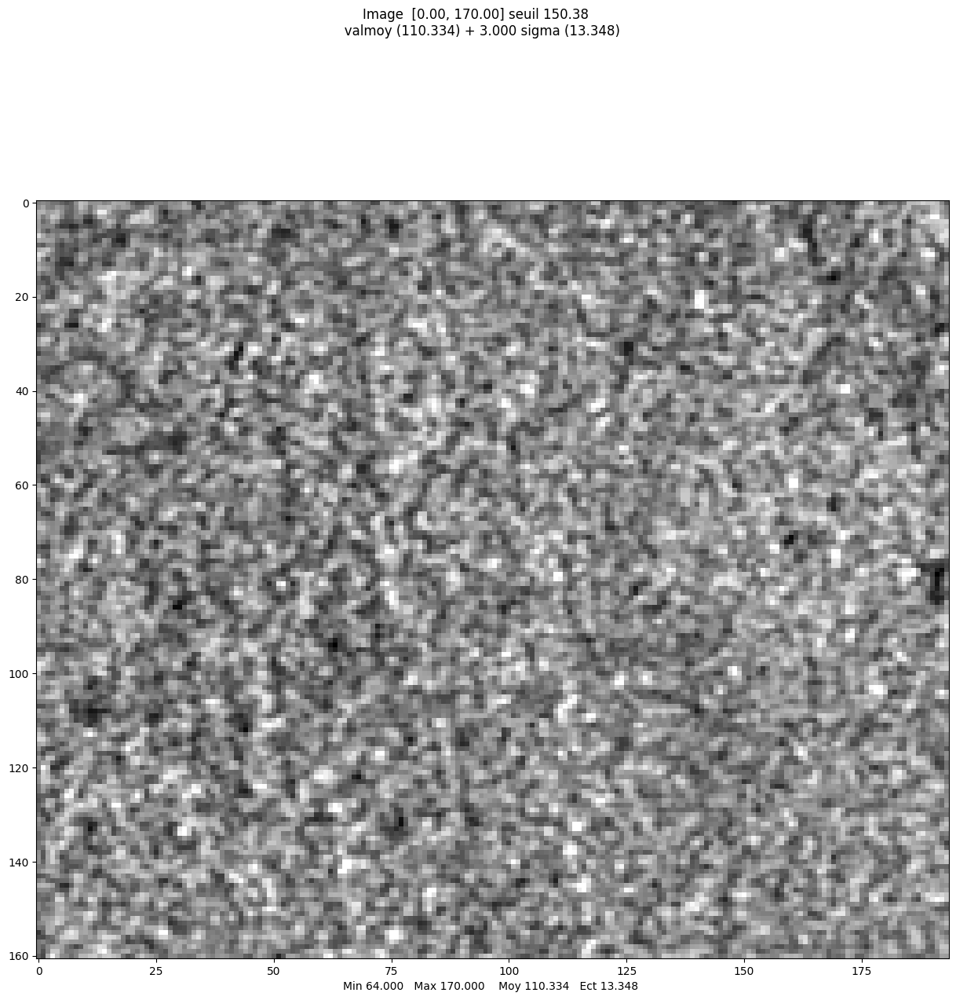

=== Sentinel-1 GRD ===
Coeff Var = 0.24286821
ENL = 16.953471429933643


In [13]:
# On commence par Sentinel-1
amp_s1grd = np.load("amplitude_Sao-Paulo_S1_SM_GRD.npy") #amplitude
amp_s1grd_coast = amp_s1grd[745:906, 762:956]
mvalab.visusar(amp_s1grd_coast)

# compute coefficient of variation and number of looks
int_s1grd = amp_s1grd_coast**2 # intensité
m_s1 = np.mean(int_s1grd) # moyenne locale
s_s1 = np.std(int_s1grd) # écart-type local
coeff_var_s1grd = s_s1 / m_s1
L_s1grd = 1.0 / coeff_var_s1grd**2

print('=== Sentinel-1 GRD ===')
print('Coeff Var =', coeff_var_s1grd)
print('ENL =', L_s1grd)

Affichage d'une image reelle
plt.show dans visusar : image 258 x 314


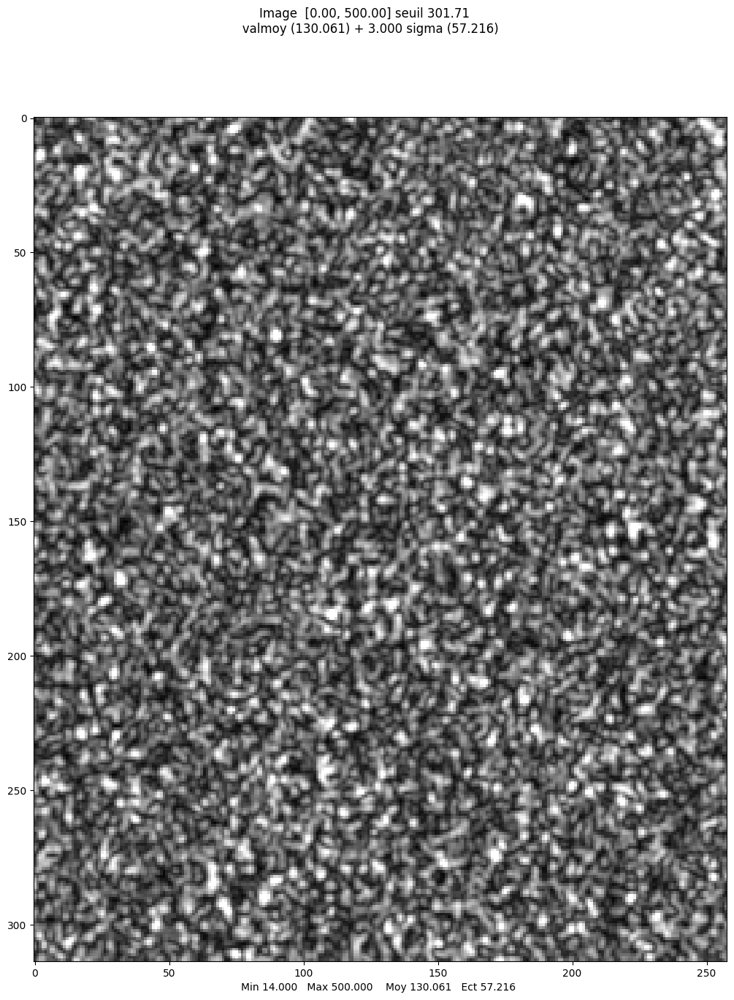

=== TerraSAR-X GRD ===
Coeff Var = 0.90132064
ENL = 1.2309527156408964


In [15]:
# Puis TerraSAR-X
amp_tsxgrd = np.load("amplitude_Bologne_TSX_SM_MGD.npy")
amp_tsxgrd_field = amp_tsxgrd[411:725, 766:1083]
mvalab.visusar(amp_tsxgrd_field)

# meme chose
int_tsx = amp_tsxgrd_field**2
m_tsx = np.mean(int_tsx)
s_tsx = np.std(int_tsx)
coeff_var_tsx = s_tsx / m_tsx
L_tsx = 1.0 / coeff_var_tsx**2

print('=== TerraSAR-X GRD ===')
print('Coeff Var =', coeff_var_tsx)
print('ENL =', L_tsx)

<h4 style="color:#2A9D8F; font-family:Arial, sans-serif; margin-bottom:10px;">
  <strong>Question B.1.</strong>
</h4>
Comment the number of looks you have found for GRD date from Sentinel-1 and TerraSAR-X (is it an integer value ? why not ? what does it mean ?).

<h4 style="color:#2A9D8F; font-family:Arial, sans-serif; margin-bottom:10px;">
  <strong>Answer B.1.</strong>
</h4>
On obtient un ENL de :
* **16.95** pour Sentinel-1
* **1.23** pour TerraSAR-X

C'est deux valeurs ne sont pas des entiers. En effet l'ENL désigne en thérie le nombre de look qu'on effectue. C'est à dire qu'on accepte de sacrifier de la résolution pour diminuer le speckle. 

Mais en réalité ces looks ne sont pas indépendants et donc on a pas un entier.

Un fort ENL signifie une forte atténuation du speckle, mais une image plus lisse. Alors qu'un ENL proche de 1 s'approche de l'image de base.

<h4 style="color:#2A9D8F; font-family:Arial, sans-serif; margin-bottom:10px;">
  <strong>Question B.2.</strong>
</h4>
Comment the number of looks you find for a Single Look Complex (SLC) image from TerraSAR-X satellite. Does it seem that this image comes from a spatial average of pixels?

In [16]:
# Download the image
!wget "https://partage.imt.fr/index.php/s/N2Rk79o8tx6Ntyg/download/complex_Rome_TSX_SM_SSC.npy"

--2025-05-21 16:28:44--  https://partage.imt.fr/index.php/s/N2Rk79o8tx6Ntyg/download/complex_Rome_TSX_SM_SSC.npy
Résolution de partage.imt.fr (partage.imt.fr)… 193.48.235.12
Connexion à partage.imt.fr (partage.imt.fr)|193.48.235.12|:443… connecté.
requête HTTP transmise, en attente de la réponse… 200 OK
Taille : 8388736 (8,0M) [application/octet-stream]
Sauvegarde en : « complex_Rome_TSX_SM_SSC.npy »

complex_Rome_TSX_SM 100%[===================>]   8,00M  5,68MB/s    ds 1,4s    

2025-05-21 16:28:45 (5,68 MB/s) — « complex_Rome_TSX_SM_SSC.npy » sauvegardé [8388736/8388736]



Affichage d'une image reelle
plt.show dans visusar : image 233 x 139


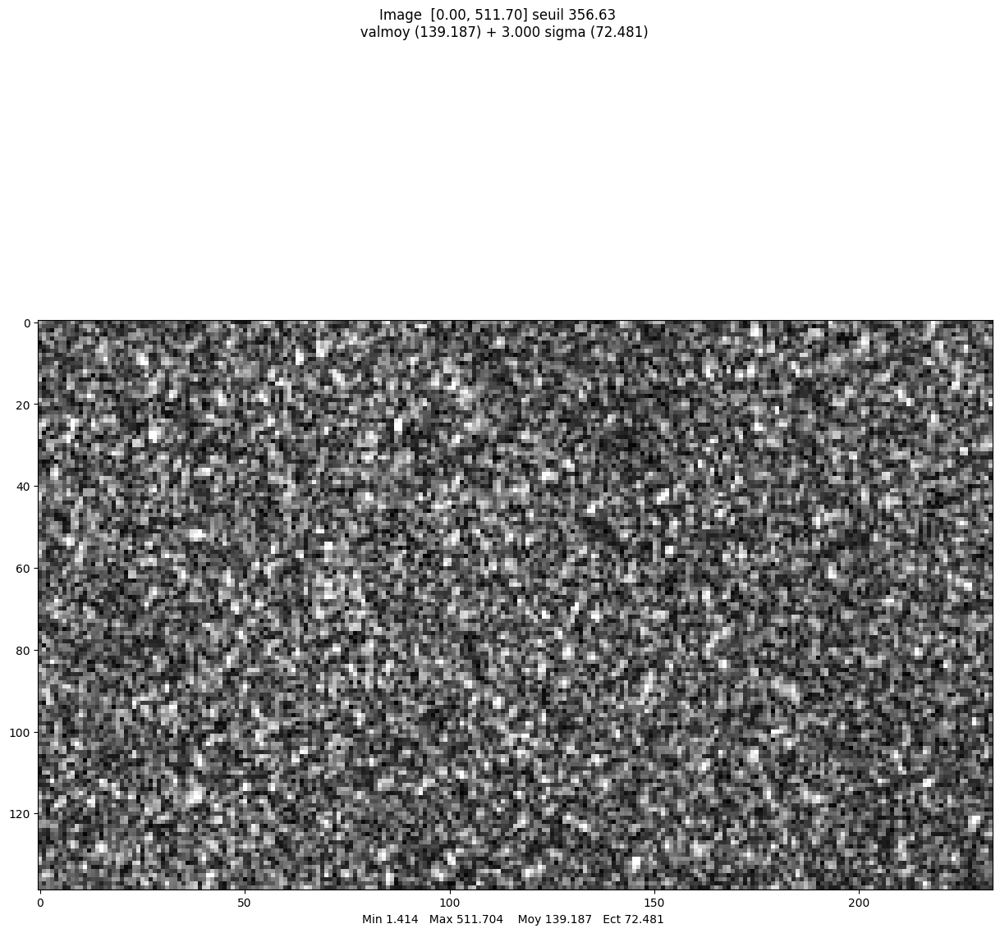

Coeff Var = 0.996456
ENL = 1.0071258040090094


In [17]:
ima_tsxslc       = np.load("complex_Rome_TSX_SM_SSC.npy")
amp_tsxslc       = np.abs(ima_tsxslc)
amp_tsxslc_homog = amp_tsxslc[492:631, 89:322]
mvalab.visusar(amp_tsxslc_homog)

int_tsxslc = amp_tsxslc_homog**2
m_tsxslc = np.mean(int_tsxslc)
s_tsxslc = np.std(int_tsxslc)
coeff_var_tsxslc = s_tsxslc / m_tsxslc
L_tsxslc = 1/coeff_var_tsxslc**2
print("Coeff Var =", coeff_var_tsxslc)
print("ENL =", L_tsxslc)

<h4 style="color:#2A9D8F; font-family:Arial, sans-serif; margin-bottom:10px;">
  <strong>Answer B.2.</strong>
</h4>
Pour la zone homogène de l’image SLC TerraSAR-X, on obtient :
- Coefficient de variation = 0,996  
- ENL = 1,007  

Ces valeurs sont très proches de 1, ce qui signifie que le speckle n’a pas été réduit par moyennage spatial.  
Autrement dit, l’image reste en single-look.

<h1 style="color:#FF8C00; font-family:Arial, sans-serif;">
  C. Spatial multi-looking and implementation of the Lee filter
</h1>

In this part we will try simple speckle reduction method using the following step :
- first we will compute a mean filter
- then we will compute the local coefficient of variation (using the same size for the moving window)
- finally we will combine these two results to obtain the Lee filter.

<h2 style="color:#006400; font-family:Arial, sans-serif;">
  C.1 Computation of the mean filter
</h2>

Compute the mean filter using a 2D convolution of the Rome Single Look Complex (SLC) image ("ima_tsxslc").

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


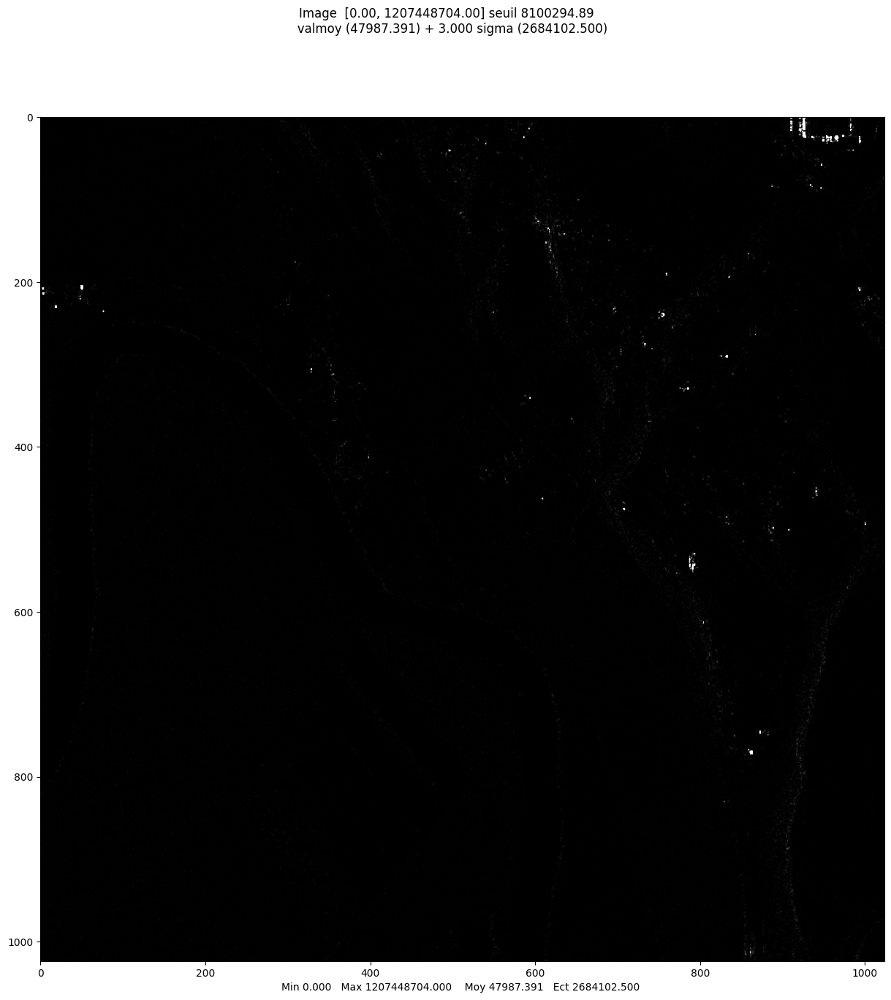

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


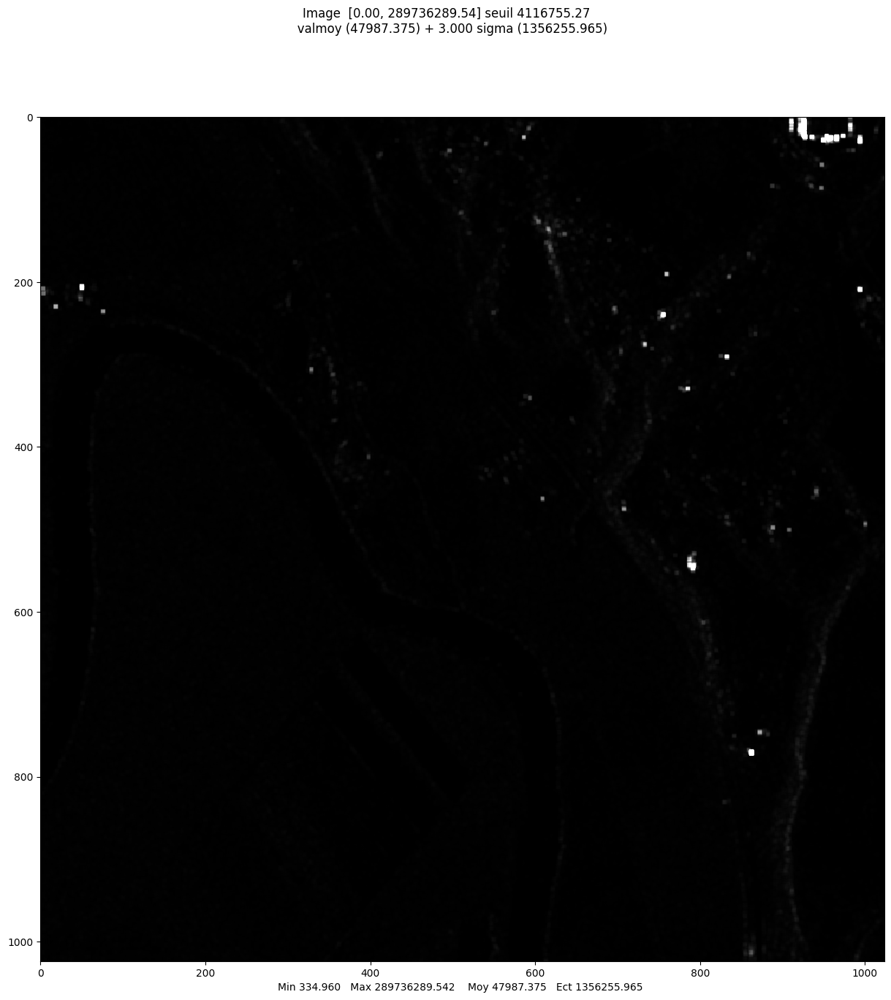

array([[12044.07974609, 14722.95991211, 22020.52053711, ...,
        44805.12116455, 39751.60209717, 23189.80139404],
       [14264.79975586, 17677.91999512, 24067.72062012, ...,
        39978.68135132, 37111.80200073, 21996.44147339],
       [16034.79999023, 18804.80022949, 24129.88046387, ...,
        30546.52085693, 27634.64133057, 17953.68080444],
       ...,
       [17824.04063477, 17378.76021973, 17149.28010254, ...,
         6888.43979248,  8504.19968506,  8888.11967285],
       [15699.08020508, 14853.87986816, 17306.59986816, ...,
         5485.71986084,  6319.27982178,  6631.4798291 ],
       [17215.52021484, 17221.75981445, 18503.27973633, ...,
         4205.52006348,  4555.92000488,  3882.5199707 ]])

In [19]:
# take the intensity
ima_int = np.abs(ima_tsxslc)**2
mvalab.visusar(ima_int)

# create the average window
size_window = 5
mask_loc = np.ones((size_window, size_window))
mask_loc /= mask_loc.sum()

# compute the mean image (intensity data)
ima_int_mean = signal.convolve2d(ima_int, mask_loc,mode='same',boundary='symm')

# display the result
mvalab.visusar(ima_int_mean)

<h4 style="color:#2A9D8F; font-family:Arial, sans-serif; margin-bottom:10px;">
  <strong>Question C.1.</strong>
</h4>
What is the effect of the mean filter ? (advantages and drawbacks). What is the influence of the window size ?

<h4 style="color:#2A9D8F; font-family:Arial, sans-serif; margin-bottom:10px;">
  <strong>Answer C.1.</strong>
</h4>

Le **mean filter** lisse le speckle en réduisant la variance locale, mais il floute aussi les détails.
- *Avantages* : simple à implémenter, et rapide.
- *Inconvénients* : perte de résolution

Taille de fenêtre :
* Petite fenêtre (3x3) => peu de réduction du speckle mais pas trop de flou
* Grande fenêtre (15x15) => atténuation forte du bruit, mais flou important

<h2 style="color:#006400; font-family:Arial, sans-serif;">
  C.2 Lee filter
</h2>

Given a neighborhood, the Lee filter of an image $I_s$ can be computed by the following steps:

*   Compute the local mean of the image $\hat{\mu}_{s}$ (convolution by some mean filtering for the given neighborhood).
*   Compute the local variance of the image and the local (empirical) coefficient of variation $\hat{\gamma}_s$ for the given neighborhood.
*   Compute $k_s$ given by:
$$
  k_s=1- \frac{\gamma_{Sp}^2}{\hat{\gamma}_s^2}
$$
where $\gamma_{Sp}$ is the theoretical value of the coefficient of variation for a pure speckle ($\gamma_{Sp}=\frac{1}{\sqrt{L}}$ for a L-look intensity image).
*   Compute the final filtered image
$$
  \hat{I}_s= \hat{\mu}_{s}+k_s (I_s-\hat{\mu}_{s})
$$

Create a function performing Lee filter on an image, for a given neighborhood and number $L$ of look.

Then, knowing that a SLC image is a 1-look complex image, compute the Lee filter on the intensity image of "ima_tsxslc".

Displaying locally averaged image.
Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


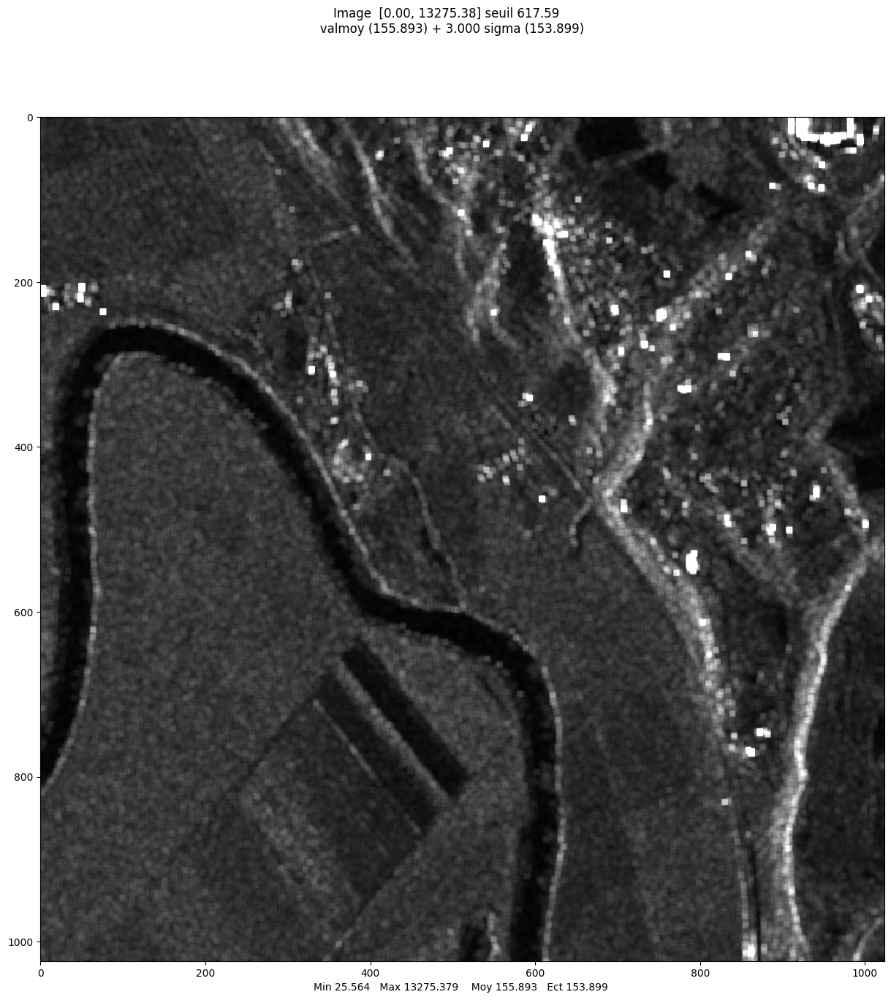

Displaying (square root of) local standard deviation. Square root is applied so the displayed image is not completely dark.
Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


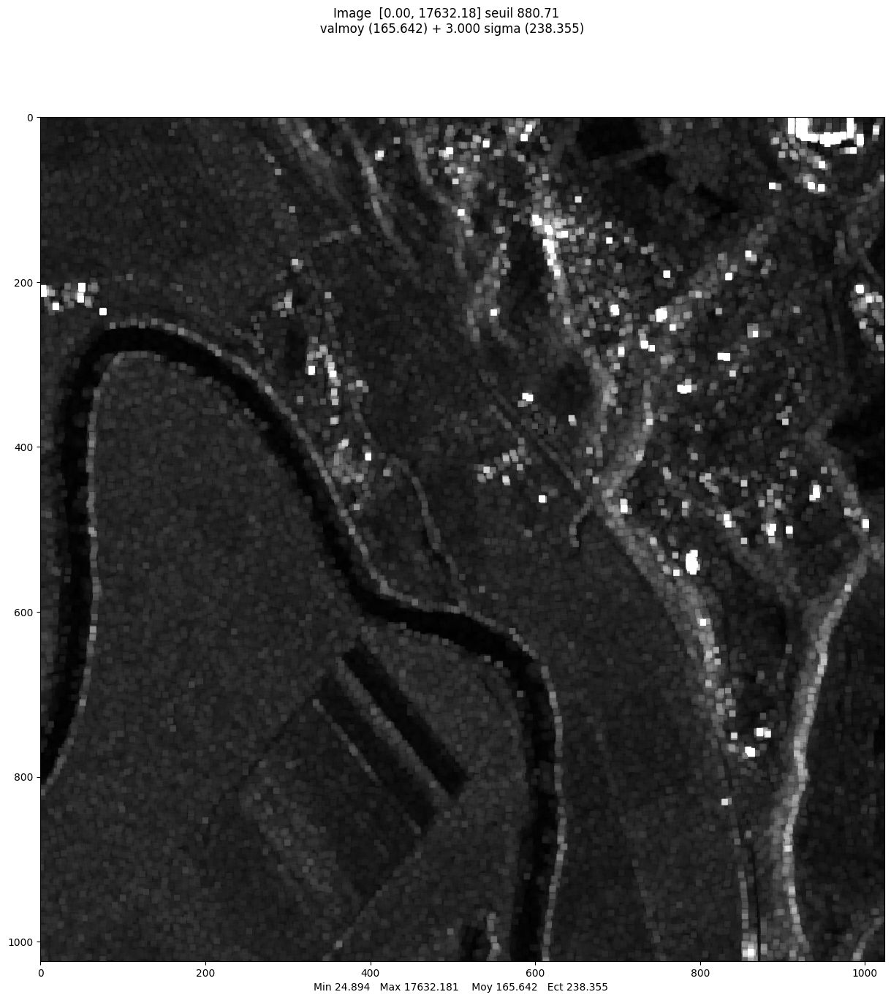

Displaying local coefficient of variation.
Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


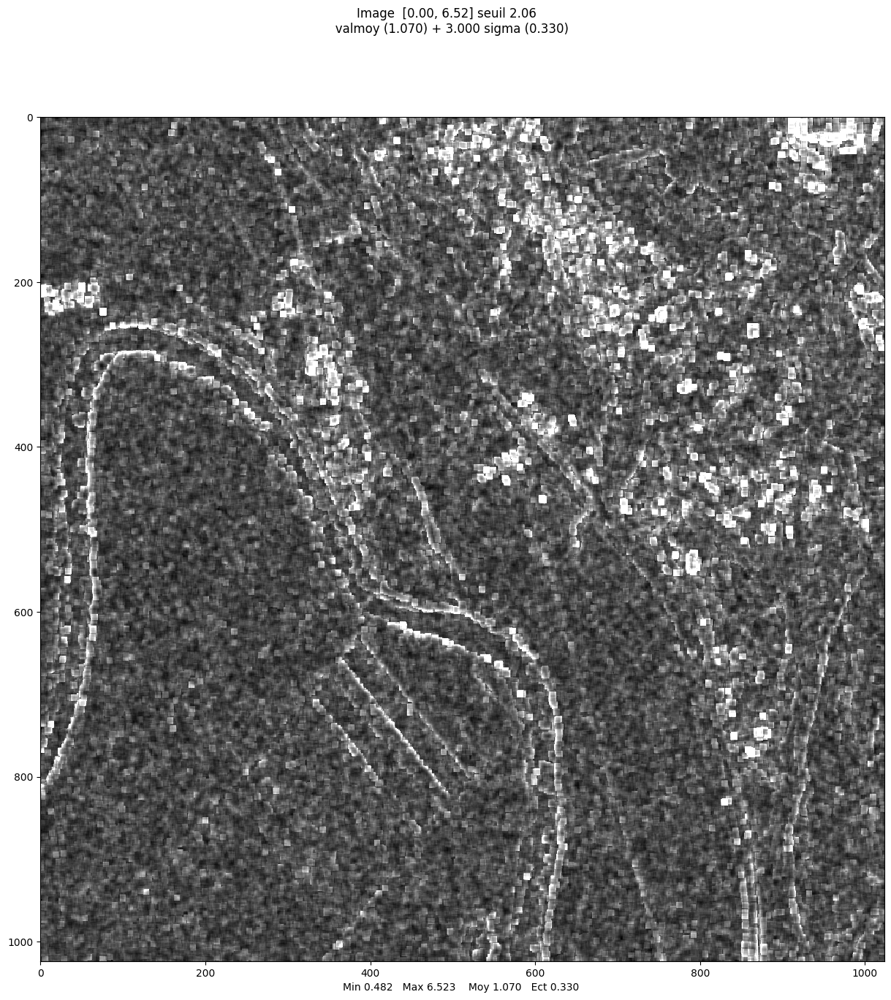

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


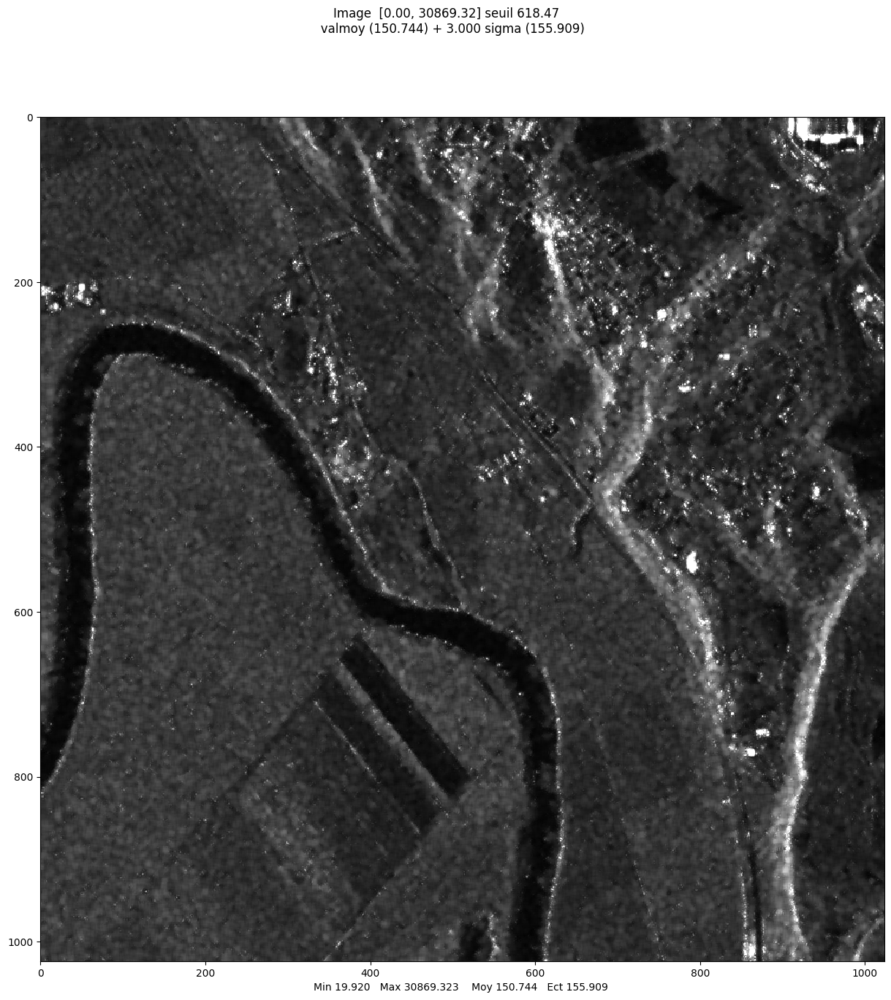

array([[133.2321123 , 146.14153156, 156.0286483 , ..., 191.38997774,
        184.59227325, 176.53928611],
       [129.38457148, 139.99169225, 148.25997694, ..., 186.56404801,
        168.74156428, 177.15234632],
       [129.51479355, 138.42805741, 142.64090915, ..., 189.59365358,
        162.91070107, 140.71390698],
       ...,
       [131.68794387, 138.78209388, 151.51046928, ...,  80.0270351 ,
         81.18107638,  85.73678109],
       [125.72589264, 132.92333251, 154.70176039, ...,  77.54985147,
         78.72958025,  82.31460155],
       [128.55206265, 135.76773428, 152.50250593, ...,  75.34844191,
         77.36541936,  79.61411928]])

In [20]:
def lee_filter(im_int, neighborhood=7, L=1, visualize=False):

  # Mask
  kernel = np.ones((neighborhood, neighborhood)) / (neighborhood**2)

  # Compute local mean image
  im_int_mean = signal.convolve2d(im_int, kernel, mode='same', boundary='symm')

  # Compute local coefficient of variation (thanks to local variance and local mean)
  local_2nd_order_moment_int = signal.convolve2d(im_int**2, kernel, mode='same', boundary='symm')
  local_var_int = local_2nd_order_moment_int - im_int_mean**2 # variance = (2nd order momentum) - mean^2
  local_coeff_var_int = np.sqrt(local_var_int) / im_int_mean
  local_ks = 1 - (1.0/L) / (local_coeff_var_int**2)
  local_ks = np.clip(local_ks, 0, 1)

  # Compute Lee filter
  filtered_im_int = im_int_mean + local_ks * (im_int - im_int_mean)

  # Visualizations
  if visualize:
    print("Displaying locally averaged image.")
    mvalab.visusar(np.sqrt(im_int_mean))
    print("Displaying (square root of) local standard deviation. Square root is applied so the displayed image is not completely dark.")
    mvalab.visusar(np.sqrt(local_var_int)**(1/2))
    print("Displaying local coefficient of variation.")
    mvalab.visusar(local_coeff_var_int)

  return filtered_im_int


lee_filtered_int = lee_filter(ima_int, neighborhood=7, L=1, visualize=True)
mvalab.visusar(np.sqrt(lee_filtered_int))

<h4 style="color:#2A9D8F; font-family:Arial, sans-serif; margin-bottom:10px;">
  <strong>Question C.2.</strong>
</h4>
Which information is enhanced in the image of the local standard deviation ? In the image of the local coefficient of variation ? Which one is the more useful ?

<h4 style="color:#2A9D8F; font-family:Arial, sans-serif; margin-bottom:10px;">
  <strong>Answer C.2.</strong>
</h4>

- L’image de la std locale met en valeur les zones où l’intensité varie rapidement, comme les bords.
- L’image du coeff de variation normalise ces fluctuations et detecte donc mieux la vraie variation sans être affectée par la luminosité. C'est cette image qui est à priori plus utile.  

<h4 style="color:#2A9D8F; font-family:Arial, sans-serif; margin-bottom:10px;">
  <strong>Question C.3.</strong>
</h4>

Compare the results of the mean filter and the Lee filter. Study the influence of the size of the window of the filters.

<h4 style="color:#2A9D8F; font-family:Arial, sans-serif; margin-bottom:10px;">
  <strong>Answer C.3.</strong>
</h4>

On compare les deux filtres :
- **Mean filter** :  Il lisse uniformément le speckle mais introduit aussi du flou sur les contours.
- **Lee filter** : Il adapte le lissage à la variance locale et préserve donc mieux les contours.

Taille de la fenêtre :
* Fenêtre petite : détails mieux préservés mais moins de réduction du bruit  
* Fenêtre grande : meilleur réduction du speckle, mais perte de détails fins et affaiblir les contours, même avec Lee.

<h2 style="color:#006400; font-family:Arial, sans-serif;">
  C.4 Filtering of image "Lely" and comparison with a deep learning algorithm
</h2>

In this part, we will repeat the process done above to denoise a crop of SLC image "Lely" using the Lee filter. Then, we will compare it with the result of a deep learning algorithm called SAR2SAR (https://arxiv.org/abs/2006.15037).

In [21]:
# Download the image
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.IMA
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.dim

--2025-05-21 17:02:31--  https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.IMA
Résolution de perso.telecom-paristech.fr (perso.telecom-paristech.fr)… 2a04:8ec0:0:a::89c2:16e3, 137.194.22.227
Connexion à perso.telecom-paristech.fr (perso.telecom-paristech.fr)|2a04:8ec0:0:a::89c2:16e3|:443… connecté.
requête HTTP transmise, en attente de la réponse… 200 OK
Taille : 52428800 (50M)
Sauvegarde en : « lely_tuple_multitemp.IMA »

lely_tuple_multitem 100%[===================>]  50,00M  36,9MB/s    ds 1,4s    

2025-05-21 17:02:33 (36,9 MB/s) — « lely_tuple_multitemp.IMA » sauvegardé [52428800/52428800]

--2025-05-21 17:02:33--  https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.dim
Résolution de perso.telecom-paristech.fr (perso.telecom-paristech.fr)… 2a04:8ec0:0:a::89c2:16e3, 137.194.22.227
Connexion à perso.telecom-paristech.fr (perso.telecom-paristech.fr)|2a04:8ec0:0:a::89c2:16e3|:443… connecté.
requête HTTP transmise,

imz2mat : version janvier 2018.  Fichier à ouvrir : lely_tuple_multitemp.IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
Dans ximaread : lecture du canal 0/25
image en .IMA
image en .IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
image en .ima  512   512   canaux: 25  verif :  1
512 512
-type CFLOAT
lecture de  lely_tuple_multitemp.IMA  en quelconque 512 512 25  offset  0 <f 4  complex 1 blocksize 2097152
Boucle de lecture entre 0 et 25   sur 25 canaux
Lecture du canal 1/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 2/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 3/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 4/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 5/25
Données complexes (standard). Nouvelle version de imz2mat 

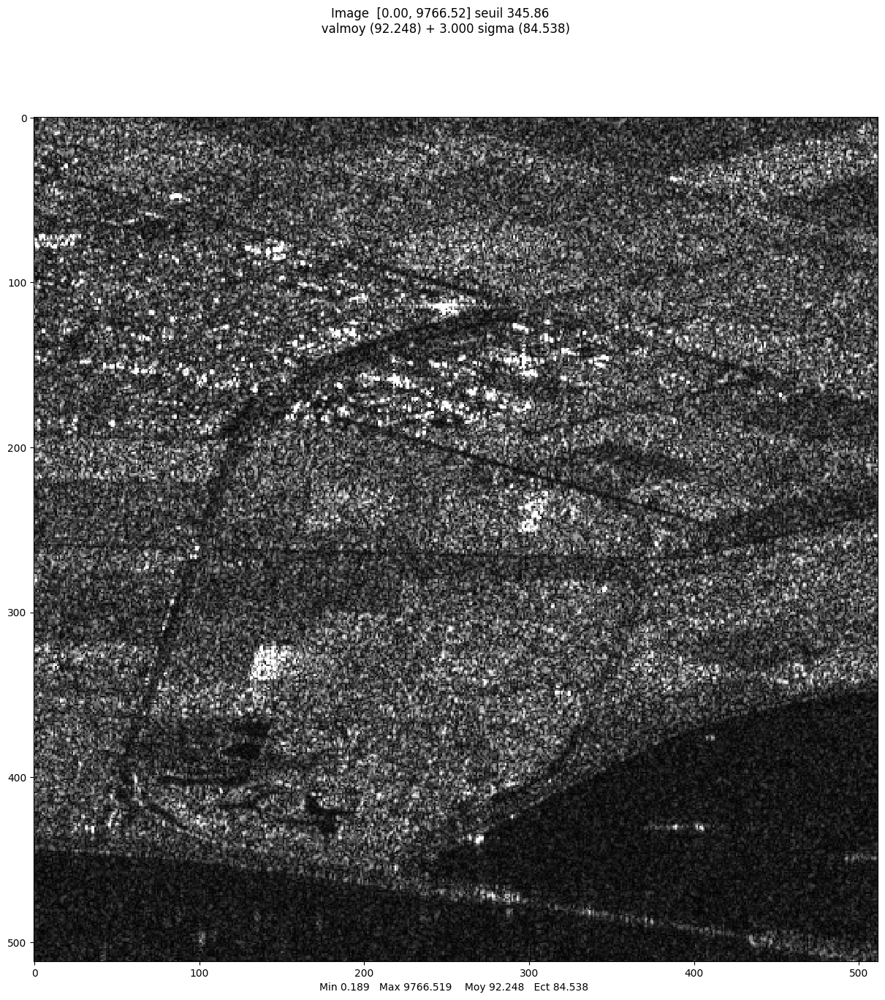

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


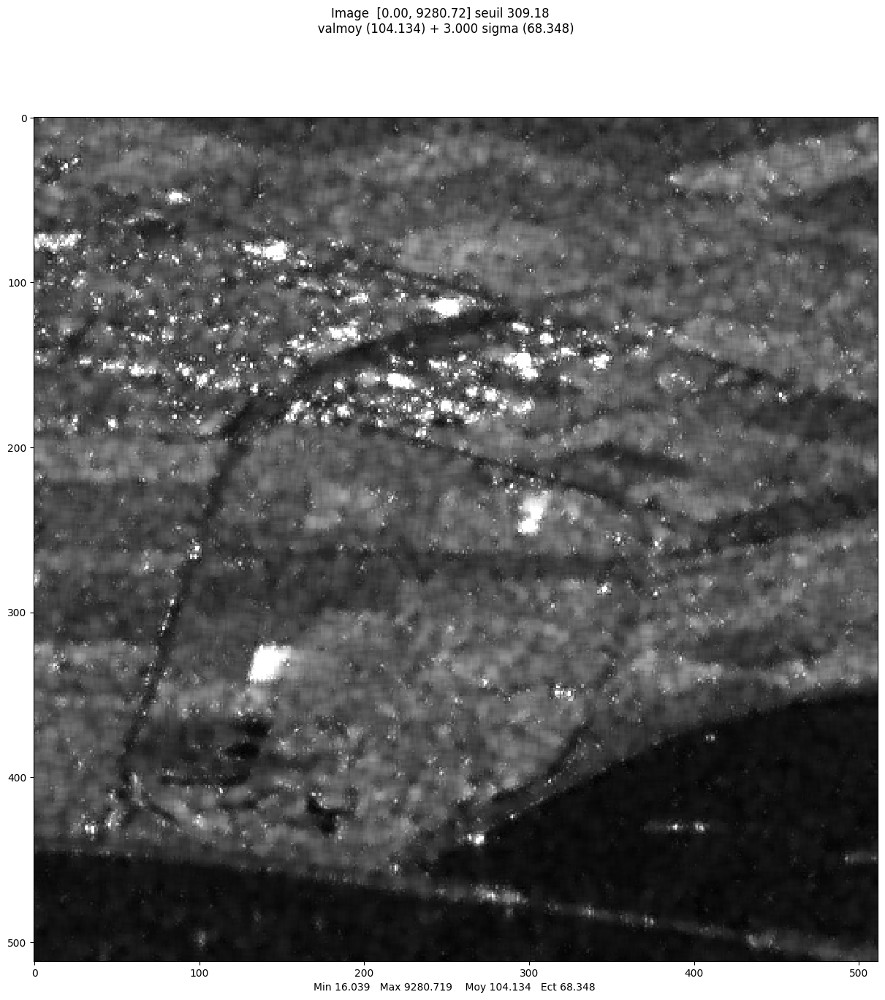

array([[ 81.14314641,  86.70792346, 104.114656  , ...,  86.38397863,
         83.34771966,  90.51879881],
       [ 73.70455815,  90.55680742,  83.92257051, ..., 106.70802265,
         87.51445849,  85.09064994],
       [ 81.06037018,  98.90262251,  92.39103074, ..., 108.88890373,
        109.87183208,  83.60564062],
       ...,
       [ 38.33386913,  38.91783253,  38.92604521, ...,  80.87993632,
         81.65279989,  86.34539786],
       [ 35.3068932 ,  36.14287688,  36.87108667, ...,  75.95673009,
         73.68493674,  79.73138404],
       [ 30.51428703,  30.59066658,  30.72023404, ...,  74.66701645,
         71.47608764,  78.92100107]])

In [23]:
part_lely_slc = mvalab.imz2mat('lely_tuple_multitemp.IMA')[0] #date is on third axis of part_lely_slc
# part_lely_slc is a single look complex image
lely_int = np.square(np.abs(part_lely_slc))
lely_int_t0 = lely_int[:, :, 0]
mvalab.visusar(np.sqrt(lely_int_t0)) # Visualize the amplitude of the first date of lely time series

# using your previous code, filter the image part_lely_int with the Lee filter
lely_filtered_t0 = lee_filter(lely_int_t0, neighborhood=7, L=1, visualize=False)
mvalab.visusar(np.sqrt(lely_filtered_t0))

<h3 style="color: #A0C4FF; font-family: Arial, sans-serif; margin-bottom: 10px;">
  Multitemporal averaging
</h3>
Instead of denoising via spatial mean filtering, one can compute a temporal averaging (mean of all available values for each pixel).

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


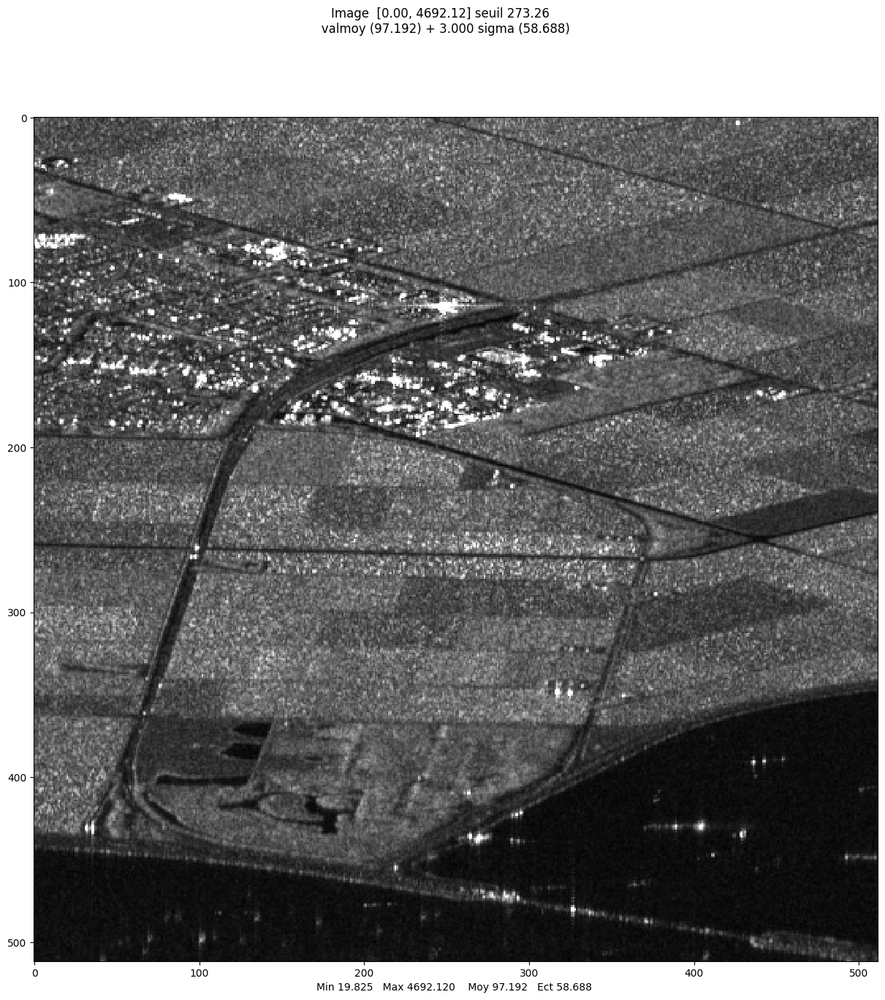

array([[ 98.33086802,  87.97624267, 108.06294787, ..., 100.24660911,
        139.32214433, 142.11651746],
       [ 88.15264674,  98.54565572, 109.70388148, ...,  93.95691987,
        126.64880816, 117.09352385],
       [116.42893572, 109.71414601, 122.08662451, ...,  97.44324375,
        106.89172491,  75.18438362],
       ...,
       [ 33.08356179,  33.74922024,  41.54763708, ...,  58.69115855,
         72.67137023,  89.34587577],
       [ 33.66300435,  35.25326719,  32.89085551, ...,  60.6965163 ,
         74.51668525,  91.14398844],
       [ 37.5381314 ,  33.2270038 ,  33.31788255, ...,  66.90555219,
         68.78198163,  80.2940211 ]])

In [25]:
lely_int_multitemp = np.mean(lely_int, axis=2)
mvalab.visusar(np.sqrt(lely_int_multitemp))

<h3 style="color: #A0C4FF; font-family: Arial, sans-serif; margin-bottom: 10px;">
  Denoised image: SAR2SAR
</h3>
The Lee filter presents some limits. More recent approaches to suppress noise rely on sofisticated algorithms. You can plot the image of Lely denoised using a deep learning algorthm called SAR2SAR (in which ground changes between the aquisitions at differents times are taken into account during its training), and compare visually the result with the image filtered using the Lee filter.

--2025-05-21 17:10:52--  https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.IMA
Résolution de perso.telecom-paristech.fr (perso.telecom-paristech.fr)… 2a04:8ec0:0:a::89c2:16e3, 137.194.22.227
Connexion à perso.telecom-paristech.fr (perso.telecom-paristech.fr)|2a04:8ec0:0:a::89c2:16e3|:443… connecté.
requête HTTP transmise, en attente de la réponse… 200 OK
Taille : 26214400 (25M)
Sauvegarde en : « lely_tuple_multitemp_SAR2SAR.IMA »

lely_tuple_multitem 100%[===================>]  25,00M  35,1MB/s    ds 0,7s    

2025-05-21 17:10:53 (35,1 MB/s) — « lely_tuple_multitemp_SAR2SAR.IMA » sauvegardé [26214400/26214400]

--2025-05-21 17:10:53--  https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.dim
Résolution de perso.telecom-paristech.fr (perso.telecom-paristech.fr)… 2a04:8ec0:0:a::89c2:16e3, 137.194.22.227
Connexion à perso.telecom-paristech.fr (perso.telecom-paristech.fr)|2a04:8ec0:0:a::89c

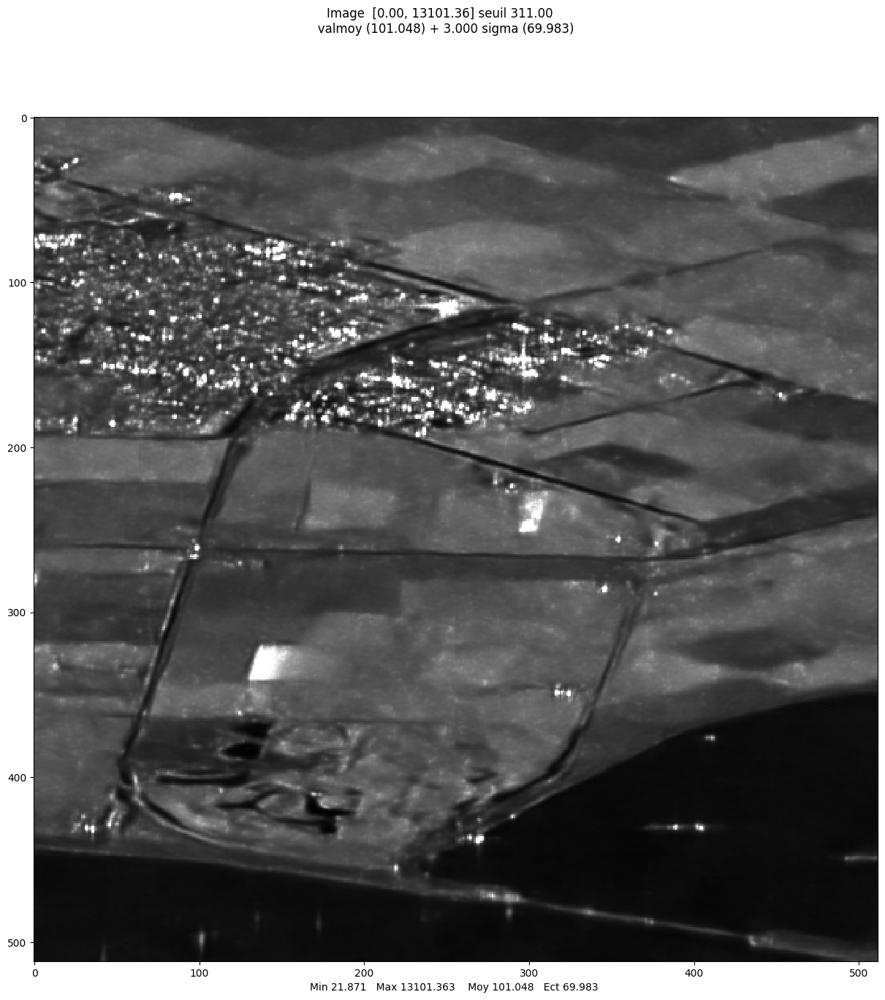

array([[108.26735687, 108.92593384, 117.21216583, ...,  87.13925171,
         89.79171753,  89.75721741],
       [105.54544067, 111.25749207, 116.15348053, ...,  95.23865509,
         96.19988251,  95.58480072],
       [105.72384644, 114.29315186, 116.50016022, ..., 100.59217072,
        100.78230286, 100.22771454],
       ...,
       [ 40.31035233,  38.88003159,  38.09856415, ...,  82.76222992,
         81.49038696,  81.83437347],
       [ 39.99552917,  38.5390358 ,  38.96235657, ...,  84.42482758,
         84.06273651,  83.64545441],
       [ 40.69298935,  38.59126282,  38.61891174, ...,  81.21070862,
         82.10493469,  87.46295166]])

In [26]:
# this image has already been processed by a CNN based filter
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.IMA
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.dim
amp_den_sar2sar = mvalab.imz2mat('lely_tuple_multitemp_SAR2SAR.IMA')
amp_den_sar2sar = np.abs(amp_den_sar2sar[0][:,:,0]) #amplitude
mvalab.visusar(amp_den_sar2sar)

<h4 style="color:#2A9D8F; font-family:Arial, sans-serif; margin-bottom:10px;">
  <strong>Question C.4.</strong>
</h4>
Do a comparison between the CNN filtering and the Lee filter. Comment the two results. Are homogeneous areas well restored? Do the methods preserve edges and fine structures? Are artifacts introduced?

<h4 style="color:#2A9D8F; font-family:Arial, sans-serif; margin-bottom:10px;">
  <strong>Answer C.4.</strong>
</h4>

**Lee filter** semble bien lisser les zones homogènes tout en conservant un peu se speckle. 

Alors que **SAR2SAR** lisse bien plus l'image avec une suppression quasi totale du bruit. Néanmoins cela semble presque excessif.


<h2 style="color:#006400; font-family:Arial, sans-serif;">
  C.5 Residual noise
</h2>

Performances of a denoising algorithm can be visually interpreted by looking at the *residual noise* (i.e. the ratio between the noisy image and the denoised image, in intensity). For a quantitative evaluation, we can look at the noise statistics, knowing that, in intensity, statistics of speckle S are:
- $\mu_S=1$
- $\sigma^2_S = \frac{1}{L}$

<h4 style="color:#2A9D8F; font-family:Arial, sans-serif; margin-bottom:10px;">
  <strong>Question C.5.</strong>
</h4>
Compute the aforementioned ratio image (with the intensity of the acquisition time 0 "lely_int_t0"), its mean value and variance for the image restored using the Lee filter, the temporal average and the result of SAR2SAR. Comment the results.

What is the interest of computing the residual noise? Why is the residual noise of the temporal averaging not homogeneous at all? What are your conclusions for the lee filter and the CNN filter?

<h4 style="color:#2A9D8F; font-family:Arial, sans-serif; margin-bottom:10px;">
  <strong>Answer C.5.</strong>
</h4>

Calculer le bruit résiduel permet d'évaluer ce qui reste de bruit après filtrage, et de détecter les zones où le débruitage a mal fonctionné.

Pour les 3 traitements,, on obtient :
* Multitemporel : 
    - moyenne = 1,2 
    - variance $> 1$
    - Parmis les 3 modèles, c'est celui qui corrige le moins le speckle et obtient les moins bons résultats.
* Lee :
    - Moyenne = 0,91
    - variance = 0,63
    La variance $< 1$ indique qu'il réduit fortement le speckle, mais la moyenne n'est pas si proche de 1 que cela, il y a donc une marge d'amélioration
* SAR2SAR :
    - Moyenne = 0,97
    - variance = 0,75 
    - Il corrige moins le speckle mais obtient une moyenne plus proche de 1 et donc de meilleurs résultats. Il semble que ce soit le meilleur traitement.

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


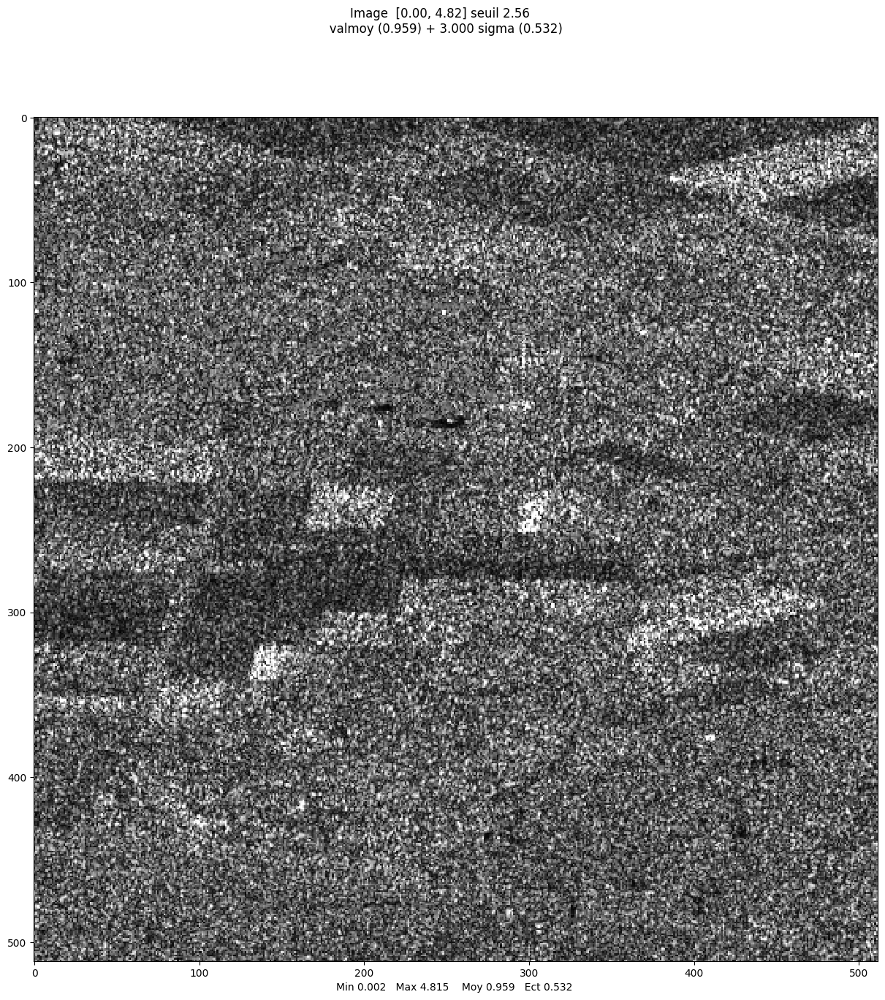

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


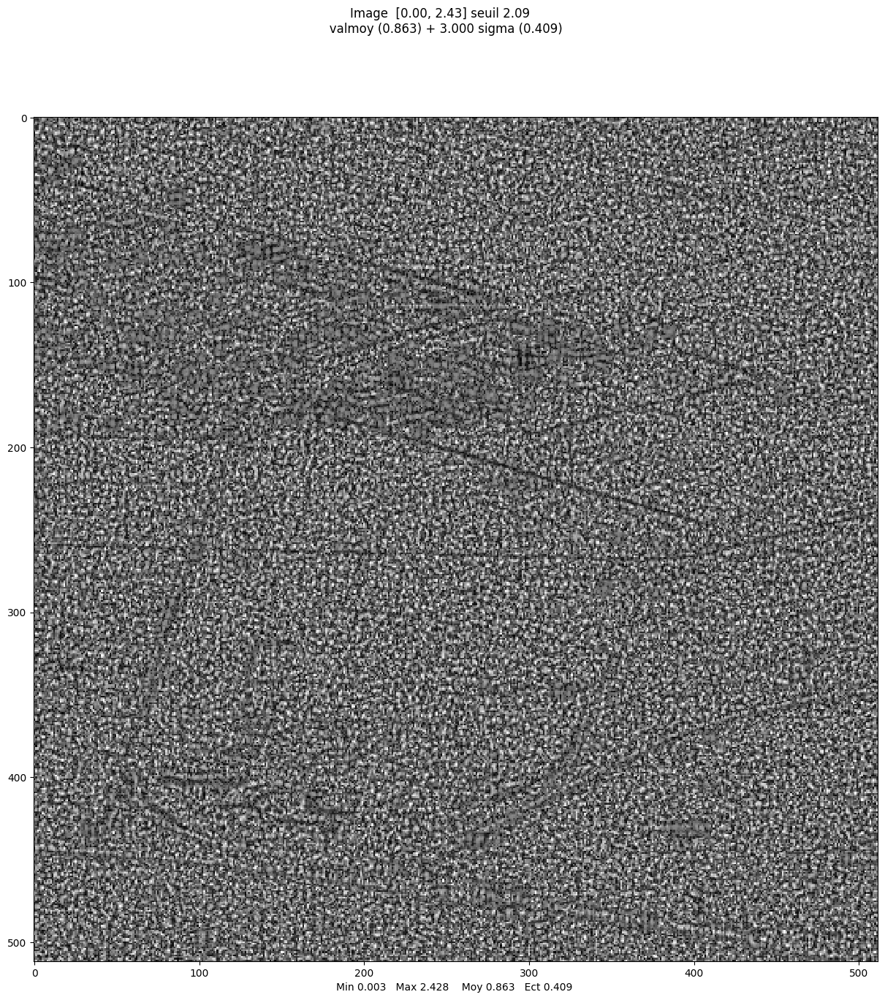

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


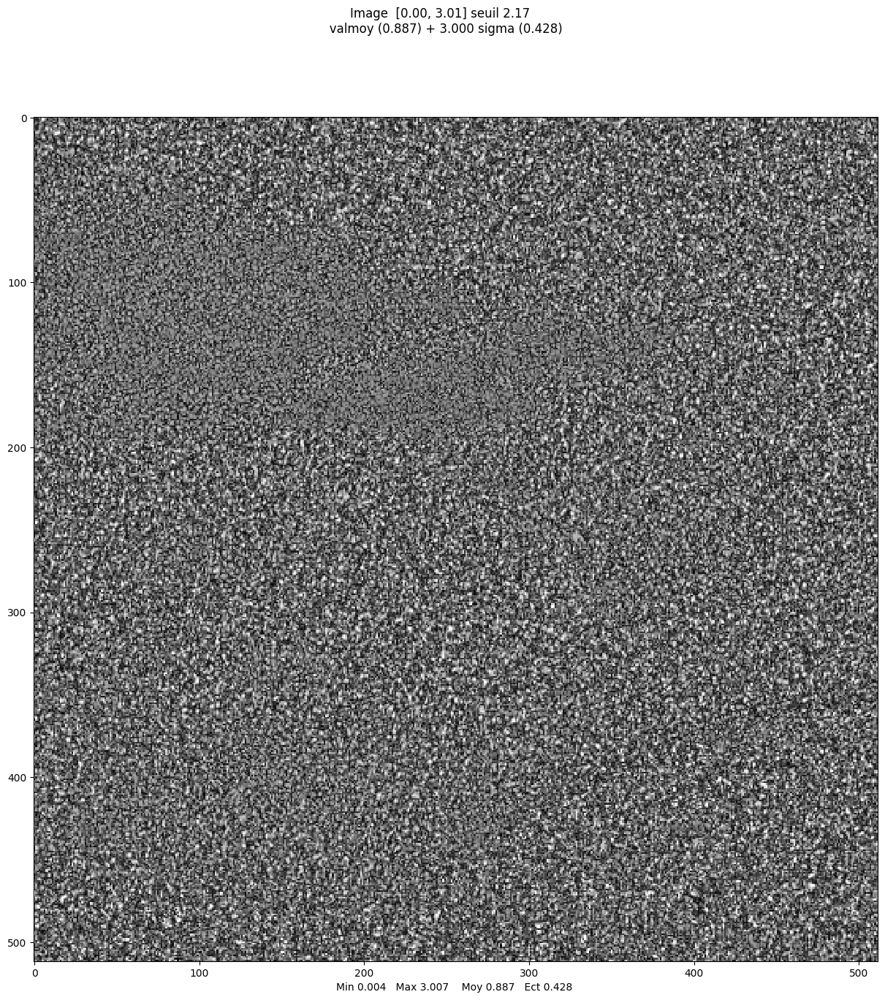

MULTI-TEMPORAL: mean = 1.2029241429298654 and var = 1.7244943881264305
LEE FILTER: mean = 0.9109006966505614 and var = 0.6302988869868444
SAR2SAR: mean = 0.9697834638584217 and var = 0.7457658171745046


In [29]:
# Residual noise of multitemporal despeckling
res_noise_temp = lely_int_t0 / lely_int_multitemp
mvalab.visusar(np.sqrt(res_noise_temp))
mean_temp = np.mean(res_noise_temp)
var_temp = np.var(res_noise_temp)

# Residual noise of Lee filtering
lee_filtered_t0 = lee_filter(lely_int_t0, neighborhood=7, L=1, visualize=False)
res_noise_lee = lely_int_t0 / lee_filtered_t0
mvalab.visusar(np.sqrt(res_noise_lee))
mean_lee = np.mean(res_noise_lee)
var_lee = np.var(res_noise_lee)

# Residual noise of SAR2SAR
res_noise_deep = lely_int_t0/(amp_den_sar2sar**2)
mvalab.visusar(np.sqrt(res_noise_deep))
mean_deep = np.mean(res_noise_deep)
var_deep = np.var(res_noise_deep)

print('MULTI-TEMPORAL: mean = '+str(mean_temp)+' and var = '+str(var_temp))
print('LEE FILTER: mean = '+str(mean_lee)+' and var = '+str(var_lee))
print('SAR2SAR: mean = '+str(mean_deep)+' and var = '+str(var_deep))